This is just for another run of lin reg because I don't want to lose data in the other notebook

In [5]:
### Cleaning up data ###
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

df = pd.read_csv('data/AirQualityUCI.csv', sep=';')

# Create timestamps
df.insert(0, 'Timestamp', pd.to_datetime(df['Date'] + ' ' + df['Time'], format='%d/%m/%Y %H.%M.%S'))

# Drop useless columns
df = df.drop(['Unnamed: 15', 'Unnamed: 16', 'Date', 'Time'], axis=1)

# Columns to floats
for col in df.columns.drop('Timestamp'):
    df[col] = df[col].map(lambda x: float(str(x).replace(',', '.')))
    
# Add NaNs instead of 200
df = df.replace(-200, np.nan)

# Remove useless columns at end
df = df.loc[~pd.isnull(df['Timestamp']), :]

# Nice alternative dataframe with timestamps as index
df_ts = df.set_index('Timestamp', drop=True)

df.to_excel('output_data/cleaned.xlsx')

In [6]:
### Imputation ###
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer


def impute(df):
    columns = df.columns
    
    # we add back NaN unless we explicitly want imputed values
    add_back_nan = df.isna()

    gts = ['CO(GT)', 'C6H6(GT)', 'NOx(GT)', 'NO2(GT)', 'NMHC(GT)']
    add_back_nan.loc[df.index < '2005-01-01', gts] = False
    add_back_nan[['NMHC(GT)']] = False

    # lags = pd.concat([df.shift(i).add_suffix(f'_lag{i}') for i in [1,-1]], axis=1)
    # df = pd.concat([df, lags], axis=1)

    # default bayesian ridge iterative imputer
    model = IterativeImputer(random_state=0,max_iter=1000)
    imputed = pd.DataFrame(model.fit_transform(df), columns=df.columns, index=df.index)[columns]

    # post processing of imputed dataframe
    imputed.drop(filter(lambda x : 'lag_' in x, imputed.columns), axis=1)
    for col in imputed.columns:
        imputed.loc[(imputed[col] < 0.05).to_numpy(), col] = np.nan
    imputed = imputed.interpolate(method='time')

    imputed[add_back_nan] = np.nan

    # save result
    imputed.to_csv('output_data/imputed_all.csv')
    imputed.to_excel('output_data/imputed_all.xlsx')
    
    return imputed

df_ts_imp = impute(df_ts)

In [7]:
import itertools
import holidays
import multiprocessing
from scipy.stats import norm, linregress
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.preprocessing import MinMaxScaler 
from collections import deque
from sklearn.metrics import root_mean_squared_error

def get_train_test_validation(df_ts, *, target=None, validation=True):
    output_cols = ['CO(GT)', 'NMHC(GT)', 'NOx(GT)', 'NO2(GT)', 'C6H6(GT)']
    df_ts_input = df_ts.drop(output_cols, axis=1)
    df_ts_output = df_ts[output_cols]
    if target != None:
        df_ts_output = df_ts_output[[target]] 

    if not validation:
        df_train_X = df_ts_input[df_ts.index < '2005-01-01']
        df_test_X = df_ts_input[df_ts.index >= '2005-01-01']

        df_train_y = df_ts_output[df_ts.index < '2005-01-01']
        df_test_y = df_ts_output[df_ts.index >= '2005-01-01']
        
        return df_train_X, df_train_y, df_test_X, df_test_y 
    else:
        df_train_X = df_ts_input[df_ts.index < '2004-11-01']
        df_val_X = df_ts_input[(df_ts.index >= '2004-11-01') & (df_ts.index < '2005-01-01')]
        df_test_X = df_ts_input[df_ts.index >= '2005-01-01']

        df_train_y = df_ts_output[df_ts.index < '2004-11-01']
        df_val_y = df_ts_output[(df_ts.index >= '2004-11-01') & (df_ts.index < '2005-01-01')]
        df_test_y = df_ts_output[df_ts.index >= '2005-01-01']
        
        return df_train_X, df_train_y, df_test_X, df_test_y, df_val_X, df_val_y 
        
class OnlineLinearModel:
    def __init__(self, hours_ahead_prediction, hyperparams, model_hyperparams):
        self.model = None
        self.shift = hours_ahead_prediction
        self.win_size = 25 
        self.scaler = None
        self.hyperparams = hyperparams
        self.model_hyperparams = model_hyperparams
        self.detrend_coefs = None
        
    def _feature_transform(self, train_X : pd.DataFrame, is_live):
        train_X = train_X.copy()

        # interpolation
        if is_live:
            train_X.ffill(inplace=True) 
        else:
            train_X.interpolate(method='time', inplace=True) 
        train_X.dropna(inplace=True) # drop any columns which were NaN right at the start and could not be ffilled
        
        # calculate trends
        # sensors = ['PT08.S1(CO)', 'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)','PT08.S5(O3)']
        # def calc_trend_x():
        #     return (train_X.index - df_ts.index[0]) / pd.Timedelta(hours=1)
        # if not is_live:
        #     self.detrend_coefs = {}
        #     for s in sensors:
        #         self.detrend_coefs[s] = np.polyfit(calc_trend_x(), train_X[s], deg=2)
        # for s in sensors:
        #     train_X[f'{s}_global_detrend'] = train_X[s] - np.polyval(self.detrend_coefs[s], calc_trend_x())
         
        # temporal feature encoding
        train_X = self._derive_temporal_features(train_X)
        
        # non-window features
        train_X = self._derive_concurrent_features(train_X)

        # collapse to window. Keep timestamp of the latest item in the window
        lags = pd.concat([train_X.shift(i).add_suffix(f'_lag{i}') for i in range(1, self.hyperparams['direct_lag_window'] + 1)], axis=1)
        train_X = pd.concat([train_X, lags], axis=1).dropna()
        
        return train_X

    def _normalise(self, X, is_train):
        if is_train:
            self.scaler = MinMaxScaler().fit(X)
        return pd.DataFrame(self.scaler.transform(X), columns=X.columns, index=X.index) 
    
    def _derive_temporal_features(self, train_X):
        train_X = train_X.copy()

        # cyclic encoding
        def cycle_encode(series, max):
            angles = series * (2*np.pi/max)
            return np.sin(angles), np.cos(angles)

        train_X['hour_sin_24h'], train_X['hour_cos_24h'] = cycle_encode(train_X.index.hour, 24)
        train_X['weekday_sin'], train_X['weekday_cos'] = cycle_encode(train_X.index.weekday, 7)
        train_X['month_sin'], train_X['month_cos'] = cycle_encode(train_X.index.month, 12)
        
        # special markers
        train_X['is_weekend'] = train_X.index.weekday >= 5
        train_X['is_rush_hour'] = ((train_X.index.hour >= 6) & (train_X.index.hour <= 10)) | ((train_X.index.hour >= 18) & (train_X.index.hour <= 22)) 

        def days_from_public_hol(date):
            public_holidays = pd.Series(pd.Timestamp(x) for x in holidays.country_holidays('IT', years=[2004, 2005]).keys())
            x = public_holidays - pd.Series([date] * len(public_holidays))
            return x.abs().min().days
        def effect_of_public_hol(date, effect_scale=5):
            # use norm to get a bell shape, normalise it to 1
            return norm.pdf(days_from_public_hol(date), loc=0, scale=effect_scale) / norm.pdf(0, loc=0, scale=effect_scale)

        days_from_hol = train_X.index.map(lambda x : days_from_public_hol(x))
        train_X['days_from_public_hol'] = days_from_hol / days_from_hol.max()
        train_X['effect_of_public_hol'] = train_X.index.map(lambda x : effect_of_public_hol(x))
         
        return train_X

    def _derive_concurrent_features(self, train_X):
        # calculate all the rolls you need
        rolled168 = train_X.rolling(pd.Timedelta('168h'))
        rolled24 = train_X.rolling(pd.Timedelta('24h'))
        rolled12 = train_X.rolling(pd.Timedelta('12h'))
        rolled6 = train_X.rolling(pd.Timedelta('6h'))

        lagged_24h = train_X.rolling(pd.Timedelta('8h'), center=True).mean().shift(24)
        lagged_12h = train_X.rolling(pd.Timedelta('8h'), center=True).mean().shift(12)
        
        train_X, _ = equivalise(train_X, rolled168.mean())

        sensors = ['PT08.S1(CO)', 'PT08.S2(NMHC)', 'PT08.S3(NOx)', 'PT08.S4(NO2)','PT08.S5(O3)']
        met = ['T', 'AH', 'RH']
        all = sensors + met

        for s in sensors:
            train_X[f'{s}_detrended'] = train_X[s] - rolled168[s].median()
            
            train_X[f'{s}_delta_1h'] = train_X[s] - train_X.shift(1, fill_value=0)[s]
            train_X[f'{s}_delta_3h'] = train_X[s] - train_X.shift(3, fill_value=0)[s]
            train_X[f'{s}_delta_6h'] = train_X[s] - train_X.shift(6, fill_value=0)[s]

        for s in all: 
            train_X[f'{s}_volatility'] = rolled12[s].std()
            train_X[f'{s}_avg_24h'] = lagged_24h[s]
            train_X[f'{s}_avg_12h'] = lagged_12h[s]

        # ratios: ratio between NOx and NO2 reveals freshness of traffic emissions.
        def compress_01(x):
            # compresses a positive value into the 0-1 range with a long tail
            return 1. - np.exp(-np.max([0., x]))
        train_X['nox_no2_ratio'] = (train_X['PT08.S3(NOx)'] / (train_X['PT08.S4(NO2)'] + 1e-6)).map(lambda x: compress_01(x))
        
        # meteorogical interaction effects
        train_X['t_rh_interaction'] = train_X['T'] * train_X['RH'] # humidity-temperature synergies
        
        # capturing momentum via trends
        def get_trend(series):
            return linregress(range(len(series)), series).slope
        for s in all:
            train_X[f'{s}_momentum_6h'] = rolled6[s].apply(get_trend, raw=True)
            train_X[f'{s}_momentum_24h'] = rolled24[s].apply(get_trend, raw=True)
        
        # counter sensor drift
        train_X['sensor_age_days'] = (train_X.index - df_ts.index[0]).days # note we use the original df_ts to get first measurement

        for col in sensors:
            x = np.arange(len(train_X)) 

        
        return train_X
    
    def _y_transform(self, train_y):
        train_y = train_y.interpolate(method='time')
        if self.hyperparams['log_scale_y']:
            series = pd.Series(np.log1p(train_y.to_numpy()).flat, index=train_y.index)
            return series
        else:
            return train_y

    def _y_inverse_transform(self, pred_y):
        if self.hyperparams['log_scale_y']:
            return pd.Series(np.expm1(pred_y.to_numpy()).flat, index=pred_y.index)
        else:
            return pred_y
    
    def train(self, train_X, train_y, transform = False):
        train_X = self._normalise(self._feature_transform(train_X, False) if transform else train_X, is_train=True)
        train_y = self._y_transform(train_y) 
        
        train_X.index = train_X.index + pd.Timedelta(hours=self.shift)
        train_X, train_y = equivalise(train_X, train_y)

        self.model = Ridge(**self.model_hyperparams).fit(train_X.to_numpy(), train_y.to_numpy()) 
        return self
    
    def predict(self, test_X, transform=False):
        test_X = self._normalise(self._feature_transform(test_X, True) if transform else test_X, is_train=False)
        prediction_idx = test_X.index + pd.Timedelta(hours=self.shift)
        predictions = pd.Series(self.model.predict(test_X.to_numpy()).flat, index=prediction_idx)
        return self._y_inverse_transform(predictions)

    def transform(self, X, is_test):
        return self._feature_transform(X, is_live=is_test)

# helper functions
def equivalise(raw_true, raw_predictions):
    predictions = raw_predictions[raw_predictions.index.isin(raw_true.index)]
    true = raw_true[raw_true.index.isin(predictions.index)]
    return true, predictions
    
def grid_search(lag, train_X, train_y, val_X, val_y, hyperparams : dict, model_hyperparams : dict):
    """
    Runs a grid search. The train_y and val_y should NOT be shifted by the desired hours ahead to predict - the model does
    this automatically
    """
    hkeys, hvals = zip(*hyperparams.items())
    mhkeys, mhvals = zip(*model_hyperparams.items())
    hcombos = [x for x in itertools.product(*hvals)]
    mhcombos = [x for x in itertools.product(*mhvals)]

    best_rmse = float('inf')
    best_vals = None
    best_model = None
    
    global test_model # function must be global to run in a pool
    def test_model(hyperparams, model_hyperparams, train_X, train_y, val_X, val_y):
        model = OnlineLinearModel(lag, hyperparams=hyperparams, model_hyperparams=model_hyperparams).train(train_X, train_y, transform=False)
        true, predicted = equivalise(val_y, model.predict(val_X, transform=False))
        rmse = root_mean_squared_error(true.to_numpy(), predicted.to_numpy()) 
        return ((hyperparams, model_hyperparams), rmse)
        
    results = []
    with multiprocessing.Pool() as pool:
        for i, hcombo in enumerate(hcombos):
            hyperparams = {key: val for key, val in zip(hkeys, hcombo)}
            
            model = OnlineLinearModel(lag, hyperparams=hyperparams, model_hyperparams={})
            transformed_train = model.transform(train_X, False)
            transformed_val = model.transform(val_X, True)
            for j, mhcombo in enumerate(mhcombos):
                model_hyperparams = {key: val for key, val in zip(mhkeys, mhcombo)}
                results.append(pool.apply_async(test_model, [hyperparams, model_hyperparams, transformed_train, train_y, transformed_val, val_y]) )
    
        for r in results:
            (hyperparams, model_hyperparams), rmse = r.get()
            print(f'Evaluated hyperparameters {hyperparams} and model hyperparameters {model_hyperparams}. RMSE: {rmse}')
            if rmse < best_rmse:
                best_rmse = rmse 
                best_vals = (hyperparams, model_hyperparams)
                best_model = OnlineLinearModel(lag, hyperparams=hyperparams, model_hyperparams=model_hyperparams).train(train_X, train_y, transform=True)
        
        return best_model, best_vals


In [ ]:
# Build linear models for all lags and variables

targets = ['CO(GT)', 'C6H6(GT)', 'NO2(GT)', 'NOx(GT)', 'NMHC(GT)']
lags = [1, 6, 12, 24]

hyperparams = {
    'direct_lag_window': [6, 24, 48, 96],
    'log_scale_y': [True, False]
}
model_hyperparams = {
    'alpha': [5, 10, 15, 20, 30, 50, 80, 100, 150, 200, 500, 1000]
}

class ModelResult:
    def __init__(self, model, hyperparams, train_y_nona, train_predictions, naive_train_predictions, test_y_nona, test_predictions, naive_test_predictions):
        self.model = model
        self.hyperparams = hyperparams
        
        self.train_y_nona = train_y_nona
        self.train_predictions = train_predictions
        self.naive_train_predictions = naive_train_predictions
        
        self.test_y_nona = test_y_nona
        self.test_predictions = test_predictions
        self.naive_test_predictions = naive_test_predictions

results = {}
for mtarget in targets:
    for mlag in lags:
        print(f'==== Beginning model building for target {mtarget}, lag {mlag} ====')
        df_train_X, df_train_y, df_test_X, df_test_y, df_val_X, df_val_y = get_train_test_validation(df_ts, target=mtarget, validation=True)
        df_train_X_imp, df_train_y_imp, df_test_X_imp, df_test_y_imp, df_val_X_imp, df_val_y_imp = get_train_test_validation(df_ts_imp, target=mtarget, validation=True)
        
        if mtarget == 'NMHC(GT)':
            df_train_y = df_train_y_imp 
            df_test_y = df_test_y_imp 

        model, vals = grid_search(mlag, df_train_X, df_train_y_imp, df_val_X, df_val_y_imp.dropna(), hyperparams, model_hyperparams)
        
        # train
        df_train_y_nona = df_train_y.dropna()[mtarget]
        df_train_predict_y = model.predict(df_train_X, transform=True)
        naive_train_predictions = df_train_y.shift(mlag).dropna()[mtarget]
        
        df_train_predict_y, naive_train_predictions = equivalise(df_train_predict_y, naive_train_predictions) # make sure we only test values both predict
        df_train_y_nona, df_train_predict_y = equivalise(df_train_y_nona, df_train_predict_y)
        df_train_y_nona, naive_train_predictions = equivalise(df_train_y_nona, naive_train_predictions)

        # test
        df_test_y_nona = df_test_y.dropna()[mtarget]
        df_test_predict_y = model.predict(df_test_X, transform=True)
        naive_test_predictions = df_test_y.shift(mlag).dropna()[mtarget]

        df_test_predict_y, naive_test_predictions = equivalise(df_test_predict_y, naive_test_predictions) # make sure we only test values both predict
        df_test_y_nona, df_test_predict_y = equivalise(df_test_y_nona, df_test_predict_y)
        df_test_y_nona, naive_test_predictions = equivalise(df_test_y_nona, naive_test_predictions)

        results[(mtarget, mlag)] = ModelResult(model, vals, df_train_y_nona, df_train_predict_y, naive_train_predictions, df_test_y_nona, df_test_predict_y, naive_test_predictions)

==== Beginning model building for target CO(GT), lag 1 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 0.9725665253113118
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 0.9631034090893446
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 0.9574117208125542
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 0.9538611017225755
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 0.9500426663613625
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 0.9477317126028061
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. 

In [ ]:
# Recovery of lost data
text = '''==== Beginning model building for target CO(GT), lag 1 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 0.9725665253113118
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 0.9631034090893446
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 0.9574117208125542
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 0.9538611017225755
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 0.9500426663613625
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 0.9477317126028061
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 0.9485665839211341
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 0.9502690137740271
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 0.9565242295304783
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 0.9644316811245743
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 1.0203661651720648
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.1041717826236797
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 0.9797547296629974
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 0.9820186072607088
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 0.9850814579181209
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 0.9882672440651356
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 0.9942939211115424
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 1.0044614288056999
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 1.0164302562581227
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 1.0231104376803355
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.0373045186781074
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.0493865495352972
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.1041121581374451
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.1679986096209718
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1.0139065812525914
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1.0035534381025286
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 0.9940003879780812
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 0.9859979628901419
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 0.9739218679182005
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 0.9595530338704696
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 0.9495424389194681
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 0.9464256697273293
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 0.9441023210388165
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 0.9454559125013187
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 0.9708219802678949
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.0168347911883804
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 0.9727787023628974
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 0.9729324015100896
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 0.9730678894650702
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 0.9733318074584458
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 0.9742805176266583
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 0.9773181400281056
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 0.9830924585890999
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 0.9871658127487143
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 0.9971870927828057
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.0065827502133016
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.051233264543858
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.1016189382623989
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1.0658601134335224
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1.053053488729936
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 1.042404328894218
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 1.0333875340560796
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 1.0190061811931055
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 0.9997821390643156
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 0.9838267199747375
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 0.9777409415734156
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 0.9703308056003855
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 0.9685207420072606
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 0.9854644804188537
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.023508060567802
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 0.9910998149708772
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 0.9902005067266237
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 0.9902113648925213
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 0.9903059468436887
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 0.9906007137159468
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 0.9919436466300343
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 0.9956107957488339
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 0.9986731101277296
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.0070607199783321
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.0155089259282688
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.057615155158302
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.1052167369807115
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1.073706239736215
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1.0537708160678052
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 1.0410211752673932
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 1.0318690532535093
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 1.019185240686059
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 1.0043622402430785
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 0.9930798243724442
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 0.9889380407495708
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 0.9840867754043332
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 0.9831614606770144
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 0.9975641655016144
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.028385469105884
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 1.015160017066092
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 1.0073145176161453
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 1.0040158265021484
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 1.0024779815502103
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 1.0015146160279589
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 1.0024161756646195
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 1.0058035646942838
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 1.0085268197584092
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.0157864202590121
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.0230370216900337
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.0597482576973638
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.1021320489040267
==== Beginning model building for target CO(GT), lag 6 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1.3139203084651323
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1.315087713541408
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 1.315181936193179
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 1.3150612645425455
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 1.3147895405114611
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 1.314586774629868
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 1.3150396891152956
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 1.3157443815083951
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 1.318568029029862
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 1.322462222485305
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 1.3535465500479056
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.4042098909278584
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 1.3769840012599925
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 1.3826209445002655
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 1.3856904658317788
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 1.387682084100421
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 1.3901803879268781
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 1.3928315297499587
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 1.3950284736092342
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 1.3961572036035184
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.3987661666065554
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.401414031475887
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.4185966450174061
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.4457631080054865
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1.262236192918296
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1.2548667489631982
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 1.2493190757689852
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 1.245181541068384
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 1.239773394570181
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 1.2347417811004189
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 1.2323585718437184
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 1.2319668625920899
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 1.232452157356963
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 1.2338117022612336
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 1.24573980698489
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.2658018381768497
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 1.2847492099839763
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 1.2861329092466367
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 1.2873368554449007
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 1.288528851971122
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 1.2908802672767925
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 1.2949556511605098
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 1.2994072343613734
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 1.3016470722707496
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.305951794259307
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.309327518618343
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.3236897665332774
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.3399394085565755
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1.3599563257000584
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1.3402075652160945
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 1.3272988733682933
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 1.3173204669609582
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 1.302396757509233
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 1.283650032794993
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 1.2686743075521372
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 1.262896698487387
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 1.255054000567194
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 1.251613596983322
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 1.2512116469969385
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.2609937111133043
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 1.324195797989579
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 1.3175572159026894
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 1.3137779817955484
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 1.3109108582078328
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 1.3067569679883484
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 1.3021611461842781
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 1.2996629670586177
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 1.299298810893263
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.3001429504614344
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.301924114919813
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.313855797351517
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.3292036035858568
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1.5979545022205355
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1.5121557781501258
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 1.461830960773168
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 1.4279995580956104
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 1.3844109088992602
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 1.337639428305591
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 1.3032623124831677
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 1.2899149118298803
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 1.2704996580695849
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 1.2603362905146807
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 1.244887995086927
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.2468123923534253
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 1.5535816887850729
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 1.5092211304654493
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 1.4801478008738256
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 1.45951664841851
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 1.431728190662211
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 1.4003363449236927
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 1.3759527333355799
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 1.366054429444195
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.3509842188076908
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.3426048025996473
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.3283898837111403
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.329675349808964
==== Beginning model building for target CO(GT), lag 12 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1.3343689568834571
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1.3325285340471544
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 1.3324386312104763
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 1.3328518758390326
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 1.3342508830237918
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 1.3377020547462417
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 1.3427804969966293
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 1.345835277162931
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 1.3524312165877261
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 1.3579956182400985
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 1.3832940979288242
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.4162851120182922
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 1.445334164200449
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 1.446795526535994
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 1.446078411353822
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 1.4447549953619228
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 1.4420143960413268
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 1.438218073825674
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 1.4358516694909127
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 1.435419930059438
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.4359445728271512
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.4373281176958006
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.4473249068674696
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.462543858197509
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1.3477035275920568
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1.3372078160244902
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 1.330403528140463
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 1.3256388797957235
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 1.319709501542056
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 1.3145169215258004
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 1.3122705990745804
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 1.3119655157748922
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 1.3124967588687657
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 1.313669256100106
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 1.3219942137723744
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.334185427365364
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 1.382913312270584
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 1.3807480632922708
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 1.3807908360070138
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 1.3813729971122102
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 1.3827545310470908
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 1.384690903155559
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 1.3858606350700153
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 1.3861426222366406
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.3864650368385998
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.3868470284482508
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.39140607296625
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.3992462384515254
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1.441876502788719
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1.4179579963725581
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 1.4024687420132358
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 1.3904851402202287
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 1.3724752974807455
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 1.3494916698226822
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 1.3304416754283972
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 1.3227285668971152
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 1.3114549534461253
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 1.3057006742942419
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 1.2988804222380637
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.3042316809947994
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 1.4239907307700204
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 1.4113000774591857
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 1.4035489394390679
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 1.3978082041622986
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 1.3895922258809588
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 1.379739971049797
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 1.3720173250858567
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 1.3690088269592746
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.3648690609398457
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.3631062479458007
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.3649908013887588
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.3741978472046465
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1.924318197564254
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1.7783620255467703
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 1.693353405175417
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 1.6367946645856422
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 1.5647482778587016
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 1.488319928464632
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 1.432111073364157
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 1.4099363589321716
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 1.3765150438412346
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 1.3576694470437112
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 1.3188966471562396
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.3060991296640625
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 1.8187855028757758
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 1.7440081651385522
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 1.695405615615239
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 1.6607835654341194
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 1.6137019457557293
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 1.559446370082395
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 1.515831890579657
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 1.4974265780773584
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.4678652836346584
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.4499044759692565
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.4087478696623634
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.393386450489196
==== Beginning model building for target CO(GT), lag 24 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1.4286111308470086
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1.4259464443395389
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 1.4226070273224196
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 1.4188201236122717
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 1.4109952520359605
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 1.3972580540065864
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 1.3827788305478852
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 1.376161746309893
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 1.365816308857109
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 1.3603831202564416
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 1.3572552032173262
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.3744809812800853
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 1.499131375292061
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 1.5010798739787743
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 1.49845472285918
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 1.4942598953609938
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 1.4849011688557012
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 1.4685563463689058
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 1.451849621336979
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 1.4443177692792872
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.4324253670330107
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.4258075130923709
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.4159150139226908
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.4211059383201383
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1.4510250757669219
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1.4293524116237062
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 1.416080333361125
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 1.40630907538433
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 1.3922802885455925
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 1.3749738271866485
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 1.360396481741054
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 1.3541808652113638
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 1.3443684086722034
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 1.3387568013743603
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 1.330181998363922
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.3356075431709848
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 1.4539579559056501
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 1.44553683524017
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 1.441606815951959
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 1.4389221766512255
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 1.4349115566931518
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 1.4289553574757043
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 1.4224213117898086
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 1.419095585383151
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.4131543158417035
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.4094194853877005
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.403752779809528
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.4081697781732518
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1.6194229435969187
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1.577344158146783
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 1.5489090969953683
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 1.5268979404278276
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 1.4938710444289376
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 1.4512908814044132
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 1.4146657445593047
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 1.3990826298100225
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 1.3746410246891678
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 1.3605545304838165
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 1.3329538749552714
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.3279206561457675
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 1.5953036808650196
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 1.5674051330431076
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 1.5485251330099346
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 1.534060130875707
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 1.5126035081761406
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 1.4850967390604564
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 1.4610567087420656
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 1.4505469216706286
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.4335281650968836
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.423384587582476
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.4036711795166432
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.402093163682122
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 2.75249247784358
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 2.4092893805064444
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 2.2204761413864884
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 2.097539382959997
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 1.9434259935723333
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 1.7834053106350787
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 1.6687846177813173
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 1.6243254124527882
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 1.5577091798992708
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 1.5198065790784956
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 1.4349031417985851
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 1.3943886182062726
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 2.2540593724242397
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 2.113841878300729
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 2.0276008246647885
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 1.9668139562181912
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 1.8840510415058644
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 1.788041216168107
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 1.7105850028024359
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 1.6779114691603498
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 1.6253945991551215
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 1.593277591107498
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 1.5158478026142077
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 1.4788198855311188
==== Beginning model building for target C6H6(GT), lag 1 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 4.986012121564345
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 5.033237642544952
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 5.056620247322743
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 5.066598439447088
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 5.064312788541127
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 5.022637484457563
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 4.941220418222891
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 4.890641397404299
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 4.790647363204976
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 4.725505288643545
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 4.7016609891361165
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 5.008589481174036
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 5.005102892017276
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 5.043159276309117
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 5.064072853829251
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 5.076227304518865
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 5.087461125922136
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 5.0909683930357446
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 5.088744850132799
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 5.089021970132627
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 5.097992931763798
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 5.1152089998872565
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 5.267694066326016
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 5.518181207402759
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 5.1525088376959625
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 5.096523272574649
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 5.080614453504759
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 5.07661563627224
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 5.077797630886358
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 5.077930918062546
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 5.057738854522713
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 5.036456280146346
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 4.976120818732231
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 4.919220330492553
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 4.743485392026033
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 4.751792960549311
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 4.700203735659719
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 4.707933620999097
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 4.726677299413693
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 4.7460364063961995
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 4.780388965393461
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 4.831370947439466
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 4.881029675242241
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 4.904619078854742
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 4.947973172742737
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 4.980890595178389
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 5.12994038613895
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 5.324356514392966
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 5.080460643326521
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 4.972778490179991
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 4.921981972217255
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 4.891522156783575
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 4.855497822194188
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 4.8184349041582655
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 4.787367328919985
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 4.77184769671619
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 4.7402779053202755
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 4.715223895412653
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 4.652276283323371
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 4.701148203554524
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 4.745804463291311
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 4.713650705873735
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 4.712391583656847
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 4.719369552626139
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 4.74016607060159
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 4.783955588185537
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 4.839658278663171
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 4.870354315753865
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 4.931778953278458
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 4.979545113516169
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 5.167290533969643
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 5.371912609564125
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 5.6562830390207655
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 5.373533805104682
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 5.222144056489905
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 5.125307715021369
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 5.00651210659731
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 4.886942550366312
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 4.802335833645407
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 4.768471026552466
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 4.713629904987967
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 4.678172290279948
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 4.588306464532177
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 4.58723072262804
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 5.236893926903837
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 5.1394588740405185
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 5.096253123451397
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 5.074346170373938
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 5.057991263832806
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 5.062583112186454
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 5.088844078688509
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 5.107048146609005
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 5.146735223806086
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 5.178712771829014
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 5.304484178437754
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 5.44889036511171
==== Beginning model building for target C6H6(GT), lag 6 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 7.115430402693889
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 7.040020025678672
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 6.98263753835096
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 6.932494228985914
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 6.8465189662991195
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 6.715954270293882
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 6.587494361198453
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 6.529921411481594
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 6.441911665772318
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 6.399758226399744
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 6.441286436024937
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 6.688413457842582
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 7.476095422509808
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 7.4720419135197895
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 7.459232756788051
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 7.443246630960159
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 7.409426173329215
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 7.3488792337944435
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 7.281693544424984
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 7.248821034384747
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 7.192246166023316
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 7.157472153389973
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 7.102234709368691
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 7.146262669580615
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 7.019408388708018
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 6.929715974431225
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 6.889110842360222
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 6.861967311917176
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 6.819683029754142
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 6.745545798415485
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 6.643733951297272
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 6.583369484819028
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 6.45958484752398
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 6.367850403198085
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 6.135954680113747
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 6.09341106275562
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 6.958589503132925
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 6.976909687915423
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 6.997574486832294
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 7.014474008086175
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 7.036512695529812
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 7.049267903641324
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 7.034243151553874
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 7.016812278450523
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 6.970983655996015
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 6.931518245679229
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 6.814812441619812
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 6.774382752875779
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 7.577970592440881
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 7.273567736613807
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 7.103149811255484
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 6.985233132379519
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 6.824109494124402
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 6.634103459234284
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 6.478204582721203
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 6.411683362856397
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 6.303235924057932
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 6.235501740432585
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 6.0710333114143555
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 6.017550193166434
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 7.036479852091241
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 6.988707545283893
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 6.966598712382319
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 6.951118856288523
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 6.92804458982063
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 6.895838128630484
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 6.862913016307391
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 6.846184450361101
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 6.814326720852986
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 6.791380290741918
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 6.733854209059917
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 6.729829768722345
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 9.097425961485404
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 8.375938515370073
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 8.002427956956684
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 7.761313178387445
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 7.455733869575676
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 7.124759314755596
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 6.866580085326928
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 6.757164357219815
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 6.576442434598701
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 6.46025953423648
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 6.1453773576612685
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 5.971119265815219
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 8.4798117251326
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 8.256742046642321
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 8.118230998558605
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 8.020718780234603
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 7.888129930857074
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 7.73100594488868
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 7.593459304479672
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 7.52918401449472
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 7.41261680703353
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 7.329962114992287
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 7.080959251442161
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 6.939518012065806
==== Beginning model building for target C6H6(GT), lag 12 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 8.010170566487005
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 7.7132781788262665
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 7.530065164781891
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 7.399140339511974
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 7.220925675826397
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 7.023861174726577
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 6.885223170056745
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 6.83577340465522
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 6.772131619373906
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 6.74597853524842
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 6.759714762334008
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 6.877219377745303
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 8.326162524767415
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 8.255455048294206
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 8.182501561516633
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 8.114387990810133
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 7.998152709998327
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 7.83289117373106
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 7.6850401501976
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 7.622127237192777
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 7.524515104526467
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 7.46887926503881
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 7.357225144980395
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 7.332517629791884
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 7.2984454960564475
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 7.1651200386460765
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 7.106181651768649
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 7.071521179215484
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 7.029497043853886
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 6.977754510456636
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 6.919003259486063
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 6.885423726048464
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 6.816456425911784
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 6.764309147985414
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 6.617341248457396
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 6.562608009229812
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 7.608970429723526
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 7.614481304057945
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 7.633428276189337
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 7.649742458284981
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 7.668685153051559
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 7.668697231100752
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 7.631173845060131
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 7.600146313563809
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 7.527135841629404
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 7.467909336498125
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 7.289815840724369
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 7.195885671095342
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 8.658351693667992
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 8.216151785328092
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 7.960633737684556
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 7.780493622517246
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 7.531301381957901
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 7.234757383473828
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 6.990429099997292
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 6.886336451102516
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 6.717976981645586
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 6.614527180620526
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 6.370858710268669
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 6.28059829812396
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 7.8842188600721705
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 7.802549449437565
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 7.755953712164497
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 7.720968914783143
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 7.6668484940212185
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 7.587430955205056
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 7.501151714604302
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 7.455981662695917
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 7.369297975760057
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 7.306952341137214
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 7.138433929232917
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 7.070923996142862
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 11.05129565496186
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 10.133243794087932
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 9.65026353780757
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 9.332630825104891
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 8.919267425644833
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 8.449622295372116
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 8.059718069351225
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 7.88679915556577
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 7.590405608795388
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 7.392810443980766
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 6.831714989179791
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 6.497295298055081
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 9.963159736067782
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 9.671392958372245
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 9.479337461850971
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 9.339315786202702
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 9.141664863301214
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 8.894605849460731
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 8.66617289149072
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 8.556017110435363
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 8.352117997495304
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 8.205144566725917
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 7.750136997556181
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 7.467932327265281
==== Beginning model building for target C6H6(GT), lag 24 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 8.317277242953192
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 8.338671298179658
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 8.290751923402468
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 8.216197107206524
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 8.049820261358878
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 7.758227551467286
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 7.45802385528295
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 7.321127167704477
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 7.100433168057423
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 6.972449372853893
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 6.7349100750651605
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 6.721376602858016
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 8.771983537191723
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 8.769886951095533
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 8.716901130125843
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 8.647989449207994
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 8.504712060797514
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 8.26123487411629
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 8.008200862492497
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 7.889678819970097
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 7.690719729658586
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 7.567589859968544
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 7.284915681145905
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 7.1741754397302175
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 8.31925278029234
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 8.067614400832273
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 7.923457973672346
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 7.818400161175207
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 7.662992323778201
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 7.452253859377895
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 7.246873314155242
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 7.148569359000404
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 6.975852735183823
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 6.863139159134751
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 6.597725066004141
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 6.513770541387801
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 8.218171355454663
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 8.171562347686898
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 8.145805426902173
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 8.123365440928461
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 8.080047067672185
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 7.997106062784248
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 7.8887487335191
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 7.827899824117264
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 7.707932165615557
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 7.620964726027514
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 7.38426743933966
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 7.276195359862141
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 10.315976311751703
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 9.867027125462487
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 9.559538603791147
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 9.314114263627884
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 8.930945445106065
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 8.406607156688054
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 7.921773054184372
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 7.702909841446816
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 7.33810885823414
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 7.110824290021146
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 6.583241573705931
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 6.380224839553022
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 9.265478339938715
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 9.104579628854163
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 8.989798728728568
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 8.89657869165113
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 8.747491400699209
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 8.531580813386515
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 8.311090003602267
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 8.201938919281844
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 8.002244708958818
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 7.864279760786598
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 7.493983690810673
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 7.321486181132309
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 17.332784343053657
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 15.251881652191338
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 14.162731670929913
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 13.45372913363387
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 12.539976422024882
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 11.509448566720625
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 10.654881825397322
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 10.275839181088775
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 9.628267896020976
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 9.200758237130424
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 8.024069570580297
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 7.337447162570281
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 12.669625291353801
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 12.056651536740828
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 11.681319304181798
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 11.413129286989825
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 11.0368312748624
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 10.568857194664895
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 10.144832064903289
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 9.945722124354917
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 9.588353981572537
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 9.339747836851119
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 8.605784201540324
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 8.155285813162246
==== Beginning model building for target NO2(GT), lag 1 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 34.406934857583515
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 33.259192621362885
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 32.600779906538925
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 32.172552139666365
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 31.654798524410936
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 31.16972938816724
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 30.882716649380306
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 30.79730280012975
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 30.73817831334098
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 30.795385588114453
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 31.941329794442574
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 34.290549684607846
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 35.13633920883583
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 34.19314346400604
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 33.607463354902684
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 33.20959859473377
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 32.716583053366925
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 32.27673222000622
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 32.10330944865038
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 32.10714718663638
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 32.26405420197271
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 32.49838016189605
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 34.00113933937042
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 35.969903880314604
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 38.42305856177727
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 37.199601587574605
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 36.40025124824414
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 35.81376791521046
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 34.99661131775955
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 34.04967843356846
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 33.30769010449926
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 33.00200658892591
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 32.516416064157305
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 32.222153944202056
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 31.645638420419964
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 31.93762524663659
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 38.084737019637
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 37.52811372623351
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 37.026000973178235
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 36.60218852462295
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 35.93681963878873
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 35.051569297500976
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 34.27848491145236
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 33.95250976571457
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 33.46695558688506
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 33.22782551676225
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 33.1915253025579
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 33.97534878830422
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 38.10325317909785
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 36.28644440947109
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 35.4111923698374
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 34.89719044570168
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 34.3120984732835
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 33.74246784380241
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 33.30047329783786
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 33.100335703952226
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 32.742499280544585
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 32.49632949079374
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 31.89738116161751
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 31.94685121999825
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 37.14121886610849
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 36.923238408292235
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 36.736230996467015
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 36.56686672810469
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 36.26334851676421
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 35.76187055125585
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 35.203762160684676
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 34.924097636807126
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 34.43367024190341
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 34.13058076468887
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 33.668558710432066
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 34.00302125090944
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 46.6219079661757
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 40.57694051081903
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 37.722703692076784
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 36.06341888278011
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 34.24238937184366
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 32.724150799247866
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 31.92714471565694
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 31.692105216495225
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 31.414243449044534
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 31.287149383050192
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 31.07528246716695
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 31.296322697405902
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 35.91815287961745
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 34.7465099613567
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 34.32291732315796
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 34.11290692524606
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 33.89670537846728
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 33.67057899682043
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 33.44108005219966
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 33.3190615481825
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 33.08990847195796
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 32.941683569378945
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 32.80800145223174
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 33.31255002735831
==== Beginning model building for target NO2(GT), lag 6 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 40.8143595045751
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 39.38315822867382
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 38.46853775493832
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 37.83729771943638
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 37.0254130284949
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 36.187480946371615
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 35.6187551666665
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 35.419891918431595
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 35.19465486107496
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 35.16749752244152
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 36.20957763500611
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 38.52447624726224
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 40.992040252620036
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 39.879178149269514
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 39.168194661834264
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 38.67834582419676
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 38.05728375136622
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 37.45943391327725
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 37.13680882623436
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 37.065884280832975
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 37.076867151117405
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 37.19770931153797
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 38.27245709630765
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 39.8516502294037
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 41.39170195912954
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 40.13584235667745
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 39.27873265661596
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 38.631938248749165
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 37.70217094996183
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 36.57044311861191
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 35.63056505674036
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 35.23122348804195
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 34.59994011313396
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 34.23965607391675
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 33.76486129686151
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 34.339888681213324
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 41.22666350403347
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 40.34876818622756
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 39.64726364679698
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 39.08528854265016
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 38.24923444729626
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 37.22661404011421
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 36.42944633244245
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 36.12593368014799
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 35.72445899264049
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 35.56613495938646
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 35.7651034288627
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 36.563497002423546
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 40.927574801943386
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 39.56069715801595
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 38.8390794363584
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 38.362149371355116
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 37.727622141574926
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 36.96755576983428
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 36.29930086578411
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 35.99772159388607
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 35.4927456870506
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 35.181507761635395
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 34.572888993711665
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 34.65300389705145
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 42.21337697670496
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 41.397191456454586
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 40.878551394645804
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 40.47577791556953
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 39.848077542066946
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 38.96940521574083
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 38.132274407049486
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 37.75174144856473
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 37.1330863100722
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 36.77690484836508
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 36.2406255729235
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 36.46351693413828
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 55.47637894720934
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 50.07090262480254
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 46.887214759968096
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 44.75114372625
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 42.01559660599003
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 39.12452307067403
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 37.043592391307634
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 36.24295514897607
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 35.067377795419375
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 34.42697780346901
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 33.26858590263189
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 33.24569884828383
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 40.034580542962296
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 38.65684531695153
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 37.93546545267942
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 37.461491679196136
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 36.840202539389644
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 36.12388688565249
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 35.53526813710174
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 35.28753442212575
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 34.90903173035613
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 34.710465080278226
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 34.58140044131046
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 35.07329419489272
==== Beginning model building for target NO2(GT), lag 12 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 38.67988136836491
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 37.06093197034306
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 36.239677903098645
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 35.75323510089455
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 35.22724867416635
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 34.84294214242017
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 34.75652688404119
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 34.801613595661095
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 35.02452669397374
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 35.2976597415556
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 36.92217863974935
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 39.08838693482175
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 38.10309944965917
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 37.22058641205683
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 36.7988075463288
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 36.57012833738904
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 36.36620656752341
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 36.315872447333845
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 36.460123483033286
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 36.58558451545936
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 36.89875274603473
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 37.18571870263458
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 38.495662580570276
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 39.969775835986326
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 40.47683969999017
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 39.31023424061235
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 38.51546786503219
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 37.92037977560054
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 37.08040629340478
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 36.10348860093566
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 35.35947672570715
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 35.07214470667947
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 34.67116345240315
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 34.48828630222562
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 34.55255061161082
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 35.37748847849762
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 40.551368331029344
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 39.75385052202091
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 39.13721358988847
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 38.65491357938487
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 37.95708406375392
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 37.13968210061673
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 36.539773519915286
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 36.325486636100266
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 36.069876153089595
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 35.9989236723711
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 36.38286653790427
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 37.22999124139358
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 40.038687700924584
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 38.7759466572508
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 38.23900348749023
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 37.908165138796676
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 37.46149860608643
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 36.86698905092204
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 36.27687015713028
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 35.995780193598556
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 35.51957193901826
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 35.233606829559
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 34.7910556313668
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 35.06664413736705
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 40.29949794806882
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 39.93452739606718
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 39.69117114715139
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 39.46960813868179
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 39.065559801795814
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 38.413225766889084
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 37.74136198522745
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 37.42933465997308
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 36.923717854331706
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 36.640727153907065
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 36.30996906386075
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 36.664690237959206
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 75.60290014688928
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 66.51819811642837
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 60.77621513107836
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 56.79682049941034
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 51.55312276606035
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 45.81566195932744
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 41.55562594816844
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 39.893409261319796
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 37.44950958153104
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 36.13212711317683
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 33.80533491032207
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 33.55798926066725
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 41.73648939784975
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 40.18077867875142
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 39.21272171151051
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 38.524955822923964
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 37.58344958726439
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 36.49777506176254
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 35.66147332909037
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 35.33604819842174
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 34.88091632284808
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 34.67082677957301
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 34.63688974743784
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 35.23564776954673
==== Beginning model building for target NO2(GT), lag 24 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 37.87421174139629
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 36.91152521895845
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 36.270759693743635
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 35.81147053201308
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 35.205193057548335
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 34.60925463423773
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 34.333784797212445
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 34.31758681166406
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 34.49138992266162
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 34.77266168666335
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 36.49246737914573
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 38.63097871145462
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 38.47113062580614
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 37.55513256742158
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 37.01169097572211
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 36.65950832235309
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 36.25539246325212
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 35.96847141855205
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 35.96813401596437
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 36.058565803427456
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 36.361327792839425
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 36.67329206536024
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 38.113245176048764
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 39.624430357608055
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 38.88749078475432
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 37.90336315140043
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 37.19265757313445
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 36.642992026251996
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 35.85097390159148
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 34.93628047074838
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 34.29973635930828
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 34.092688716507084
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 33.89120194368221
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 33.88514540825804
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 34.5556918301714
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 35.71350479935645
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 38.62439624961113
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 38.217258827539695
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 37.81729998496836
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 37.477763008267566
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 36.96107936862848
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 36.34277065034658
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 35.91526621722377
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 35.784314294674786
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 35.68317662690088
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 35.719401412585796
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 36.36167717581261
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 37.291807933714566
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 45.24420209637525
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 42.000954862574666
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 40.3567841438085
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 39.29886855258193
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 37.94859427857484
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 36.4868808599505
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 35.43166679349267
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 35.049405476746244
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 34.57109132434973
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 34.40124754445931
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 34.677753463140434
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 35.55104879887689
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 38.31000580350206
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 37.93419223961022
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 37.69375637382051
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 37.487333857697976
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 37.130813885928134
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 36.60141761114977
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 36.13291916200692
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 35.95330621868489
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 35.74301399954161
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 35.70092165967935
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 36.15005822530474
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 36.95355369427411
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 142.76973175543392
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 116.49626401920067
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 102.43231209215007
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 93.2160708613233
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 81.37606198441455
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 68.41656192996263
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 58.46466847026588
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 54.41884776176974
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 48.19645796658093
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 44.64741843685034
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 37.60464972338143
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 35.6710416109485
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 49.330881732417026
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 46.00645117748194
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 44.096958334387885
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 42.79071868207397
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 41.048951749717745
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 39.08699360617058
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 37.59980852735948
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 37.023929199846656
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 36.21202215689271
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 35.8211412677154
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 35.50777235790607
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 36.03768385805483
==== Beginning model building for target NOx(GT), lag 1 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 397.67602866664146
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 383.41149910473575
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 373.5951565763241
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 365.3409741163454
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 351.1260780112986
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 327.9794674004076
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 301.3050678243142
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 286.99204331486294
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 258.785128264018
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 237.6240084040127
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 176.27981983335167
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 163.82049348148834
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 178.0670999445888
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 179.69997176450303
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 180.758202686858
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 181.57595131066282
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 182.85238451181226
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 184.75038533315782
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 186.9339991925654
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 188.17837146882837
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 190.8904516291619
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 193.24349142961117
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 203.92694077524118
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 216.3694074272978
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 409.7843702798774
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 377.32281124143014
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 366.3859576649469
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 361.6394921915904
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 357.5278450898267
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 352.5602157919219
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 343.6238791197169
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 336.9583324951076
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 320.3626918433866
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 305.3105887807781
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 246.03491486372576
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 201.1409642211504
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 175.68297059168836
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 177.16939141253204
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 178.06449699166149
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 178.7133031791939
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 179.68095041391305
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 181.0945035299617
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 182.732316317738
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 183.66663717887985
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 185.68674383246028
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 187.41387060557352
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 194.9084180235816
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 202.89539126479835
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 480.75611655313
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 437.87173691265923
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 412.7407601460226
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 396.261450645331
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 375.7498939312346
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 353.96744990550866
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 335.5628355593452
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 326.49824821970316
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 308.481532999205
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 294.2254793389642
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 243.40289760463062
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 207.04403474419854
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 179.51570857161366
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 179.90736716098658
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 180.2541525055513
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 180.5893686802785
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 181.21998353729103
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 182.33342016972918
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 183.75562668578323
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 184.59613212954255
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 186.44932167126626
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 188.05289601009238
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 194.99534023658813
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 202.15473273614424
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 443.0101658535991
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 432.468384274516
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 422.45361197202914
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 413.41751439967163
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 398.2013242325074
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 375.852390423153
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 353.38999652019555
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 342.3718378586875
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 321.9600175281109
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 307.178526601461
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 258.5878418367608
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 222.77376003187953
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 187.8569875648314
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 187.56798137295777
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 187.41894151295517
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 187.33392600440422
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 187.27260288610154
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 187.37024671176806
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 187.74947314904537
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 188.06890550683448
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 188.9528580686281
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 189.86836586189537
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 194.8046210294943
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 200.76870633589374
==== Beginning model building for target NOx(GT), lag 6 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 395.39181011815685
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 386.3919054832943
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 379.0787142968003
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 372.052410623475
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 358.69844348113327
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 335.5604253748854
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 308.9168034766894
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 295.0665385406462
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 269.1305254121771
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 251.0765752939053
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 208.22103952639057
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 207.19928338289984
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 222.42809505444453
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 223.20417594860592
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 223.60667798258217
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 223.87018857751252
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 224.23064228712963
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 224.74698017038682
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 225.42813650107254
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 225.87384644742377
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 226.97261708096534
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 228.038321206177
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 233.730049621387
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 241.52680042759025
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 418.7624066353614
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 392.9569098903018
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 385.116350352925
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 381.8684844430443
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 378.6111419288098
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 372.51998658465254
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 360.9000257805386
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 352.7409038569921
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 333.74671031525173
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 317.67582756637995
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 261.59987291018024
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 225.07064883562134
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 216.51930949703
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 216.46909890479242
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 216.46926891228463
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 216.49812629026903
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 216.60322326079782
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 216.8729279464818
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 217.27521222004737
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 217.52743276823168
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 218.12233721806362
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 218.68757938028844
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 221.6572596097973
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 225.4442849620697
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 496.74071302330196
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 443.30909251829416
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 413.11693104780824
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 393.5149817472665
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 369.5164548171776
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 345.7416732663651
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 328.7707528637255
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 321.5523605293279
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 308.52293118646105
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 298.72943172957036
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 263.19705061363277
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 235.35844412562258
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 225.0439946983839
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 223.78441735466416
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 222.8175777498217
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 222.07488777050514
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 221.02468871085287
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 219.83669026648263
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 219.015943607912
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 218.75200913656306
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 218.52652743134206
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 218.59520146214825
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 220.31212887945583
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 223.2148397261438
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 618.6672410513496
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 592.7426036477721
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 568.0895850640503
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 547.3555378000746
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 515.3661646631177
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 473.5420727763596
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 436.148563400983
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 419.1922187925503
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 389.8541203948848
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 370.0882042642395
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 311.3466966203081
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 270.67445100999277
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 246.840378573738
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 244.4554792642059
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 242.09689870633122
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 240.05066131228202
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 236.79683675762743
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 232.43512587969832
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 228.57468855811427
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 226.9027118320561
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 224.26596202906472
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 222.77864774089628
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 220.57545272348787
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 221.55126704965184
==== Beginning model building for target NOx(GT), lag 12 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 441.7377885234362
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 421.45053870968945
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 404.843440185591
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 390.65809674529027
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 367.65069927253836
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 335.4156215499993
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 305.17076228698477
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 291.3041969701195
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 267.6082712169999
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 252.27827678366233
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 216.22369145861822
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 212.03574153475975
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 227.53756090057345
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 228.22207279860035
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 228.42702762851346
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 228.47203448447158
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 228.43670583612678
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 228.41068640605081
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 228.66988027797106
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 228.9557123100384
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 229.80754232973052
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 230.69919403775765
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 235.5268028057794
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 242.26606903580344
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 425.9071791398938
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 395.330584416282
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 384.92879950911566
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 379.88901209595303
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 374.2130485875806
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 365.71518468583946
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 353.32048492221577
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 345.4930676726215
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 328.3470579332133
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 314.42833957051323
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 266.78850762061575
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 234.59741341088264
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 225.57613347983082
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 224.92832897732103
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 224.6707835071563
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 224.53979417950998
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 224.42030120142368
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 224.35594027517075
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 224.3741569167433
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 224.42204924969448
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 224.6253637000982
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 224.90632681132067
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 226.95434106629992
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 229.9721924588989
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 572.9348975986921
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 500.9770628076398
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 460.1912342322001
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 433.3421663133289
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 399.74637624775727
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 365.4064498323894
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 340.7869499943473
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 330.7506605667604
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 313.96679533783055
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 302.50135964913375
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 265.7016525508717
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 239.06409627851153
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 239.74587142712642
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 236.89692222560882
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 234.82235360838033
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 233.2589624321788
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 231.04539344087084
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 228.42714210691207
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 226.35174539432646
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 225.51899810511867
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 224.31910017993727
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 223.75548961510566
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 223.8865748456879
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 226.02696027489014
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 819.8351827087134
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 757.1512452880705
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 709.1358285184058
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 672.1623688319629
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 618.7888415231189
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 553.6416449199805
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 498.8353572418925
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 474.9470602807421
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 434.9992196333082
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 409.0519402646336
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 335.9693144155507
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 288.1771064636793
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 270.52121349248824
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 265.8672948572292
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 261.8096341345259
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 258.4619652249467
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 253.3049042705959
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 246.5321798676063
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 240.53952554069633
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 237.90741775623664
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 233.6346648253244
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 231.07937210397222
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 226.02303947746418
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 225.42297066403503
==== Beginning model building for target NOx(GT), lag 24 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 455.8739843960922
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 449.45375451796315
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 439.45334670841197
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 428.3879351472207
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 406.7397210866495
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 370.94280642447393
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 333.8052529598897
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 316.23788494864857
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 286.2418428870643
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 267.2329758407593
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 223.8238567834789
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 215.21936298903378
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 233.02447433005165
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 232.36287145060234
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 231.76697855879397
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 231.23295831530893
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 230.34108624224956
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 229.1338102631576
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 228.23835492971736
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 227.98714748014382
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 227.9495495315856
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 228.31523832206054
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 232.20257839903218
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 238.91046961743783
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 504.29213765052924
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 462.53645667486404
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 442.4532491251486
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 429.4683461641602
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 411.7868013124976
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 388.28084410252467
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 363.6293343780846
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 350.81571820307636
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 326.3152694926823
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 308.6621836856102
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 257.2819237579908
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 227.76722711572708
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 237.78448747342148
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 235.52847248874588
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 234.24094920783824
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 233.3210781484125
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 231.99120959151946
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 230.25654189291492
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 228.69742259734625
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 228.03134308351315
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 227.07359104028777
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 226.67761153587344
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 227.50886966338837
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 230.3978840388012
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 840.1541022663321
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 723.8498731563305
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 655.8895214672681
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 609.4559657202615
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 548.1375446100632
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 479.5474949052437
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 425.5799734497621
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 402.8474963705725
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 365.6763444552614
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 342.0880021948773
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 279.57571638048677
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 244.16655754622636
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 265.40598264049885
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 259.53515100495304
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 255.5727490179393
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 252.60311132399585
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 248.29414635260954
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 242.86103491794552
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 238.1261990703732
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 236.0585886628963
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 232.75055898882434
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 230.8506438757288
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 227.89391944543334
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 228.81935842641448
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 1787.6459179739281
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 1444.5113143535677
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 1254.1423803005039
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 1128.993177543283
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 970.8077574751622
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 804.8617514792456
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 683.6921518517092
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 635.4602633392052
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 560.5317107495729
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 515.5098126062724
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 401.8213230471862
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 334.1386340311374
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 319.0572792896737
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 307.85266503056914
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 299.9438844914627
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 293.85685953932636
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 284.8401091092078
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 273.3078963300022
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 263.22721743072816
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 258.8068716670979
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 251.586551560631
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 247.18485063007057
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 237.45562158917852
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 234.20880277569412
==== Beginning model building for target NMHC(GT), lag 1 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 122.8791489100095
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 120.7310181024516
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 120.07030048065285
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 119.90736904958176
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 119.94313047604442
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 119.88693023091088
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 119.213434103892
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 118.6549712960597
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 117.46426978815241
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 116.76038902394012
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 118.55125242118486
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 126.10216010825599
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 127.9507459985652
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 129.033378850358
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 129.55413015112532
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 129.78282521035428
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 129.8199742697046
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 129.34296410553242
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 128.5125442106154
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 128.06932432548723
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 127.34747372423959
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 127.01333603576525
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 127.9581668372756
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 131.635565987589
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 124.64224066979862
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 122.44567410507824
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 121.03248473795627
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 120.0885595426461
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 118.99347782741778
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 118.17082018190213
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 117.87320835140991
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 117.7862825155771
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 117.54542412862575
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 117.25271674812993
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 116.43325173336355
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 118.24688561315232
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 118.26909021796884
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 118.53578019640874
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 118.99160539179891
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 119.44889336740475
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 120.2348773103735
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 121.30853826740709
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 122.18290964459726
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 122.51598223461478
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 122.97057017296848
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 123.20466450013114
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 124.19366340107283
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 126.2451494548244
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 135.33181344085236
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 131.9182408803858
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 129.58006668394867
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 127.7998798832521
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 125.21412831595477
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 122.07560113027964
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 119.59898999957679
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 118.6264479279218
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 117.23951341580238
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 116.55951154467252
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 116.20466663317569
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 118.39550256044443
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 118.9620550074128
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 118.40672619929781
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 118.40407311493017
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 118.54809667291278
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 118.94570342524227
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 119.73170674213179
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 120.66859081231075
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 121.15862936398224
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 122.07995608347068
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 122.73812996880356
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 124.97800850350811
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 127.40254567732345
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 183.93137843998915
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 167.624636580388
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 158.3507315797086
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 152.1920647859754
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 144.3046764904374
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 135.830404026389
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 129.49754256520265
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 126.97593663115894
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 123.18162143961544
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 121.09865269592471
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 117.77582152954848
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 118.52818841645804
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 142.96166762072832
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 136.6114497322143
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 133.12623649906445
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 130.9198773019234
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 128.311412239564
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 125.93946929869244
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 124.61483530377562
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 124.24086152926733
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 123.91845964963711
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 123.9255572262297
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 124.92358416896872
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 126.60631122402596
==== Beginning model building for target NMHC(GT), lag 6 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 173.03913478976963
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 169.6451403498264
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 167.35107161205505
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 165.5070796786156
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 162.5887228249937
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 158.56747197573534
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 155.00504607579836
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 153.5473684791151
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 151.5698849006104
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 150.8462169540962
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 153.03574612387325
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 158.76199355110197
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 177.70277061010734
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 177.85637188224618
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 177.49376211996653
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 176.93842280365297
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 175.67279805668127
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 173.29716042305546
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 170.55042279756856
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 169.15879018033735
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 166.66258486624852
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 165.02917533994315
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 161.50677451146
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 161.26941838004765
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 161.5578536027754
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 159.46553160945513
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 158.25339051463783
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 157.39231884698728
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 156.11819479470824
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 154.21812718625932
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 151.9963615608327
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 150.79058064256358
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 148.49351135126642
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 146.9249943243591
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 143.6520803359488
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 143.92230383092536
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 158.9650043163656
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 160.02854145120168
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 160.9295761334045
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 161.61471204480853
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 162.48201414549567
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 163.04243695326386
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 162.6881428391088
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 162.19001001085843
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 160.80836031948414
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 159.55560390577
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 155.26523404897836
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 152.90432316445998
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 179.8464091188074
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 172.88433689301795
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 168.78508202923192
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 165.93037504185173
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 162.05095240359134
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 157.51018964821952
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 153.76727494094126
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 152.15475627844535
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 149.51409233095194
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 147.87815709952096
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 144.1581067234566
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 143.2314285613705
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 158.0831056313425
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 157.1907529152806
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 157.05280935814145
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 157.05113289266143
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 157.10073331668013
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 157.11795722310393
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 156.96321464297048
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 156.80094311596739
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 156.32640392609676
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 155.8449496584433
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 153.80781598537195
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 152.46062977154136
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 335.500984776754
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 284.5669866181097
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 257.65198462232746
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 240.46477071094046
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 219.19841548590998
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 197.19535061132063
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 181.18101040116693
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 174.8378220761076
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 165.15024343405543
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 159.55433181671316
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 147.30541788269545
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 142.4423755133306
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 213.9474771470371
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 202.75144951398707
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 196.16377338380863
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 191.70633578078366
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 185.89173976794805
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 179.40207740981032
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 174.1428759798504
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 171.84083198648224
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 167.92939985834863
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 165.34587196603186
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 158.13039766266928
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 153.92322299881928
==== Beginning model building for target NMHC(GT), lag 12 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 190.92627082248478
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 182.47282754616413
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 177.48637457903374
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 174.01165374137
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 169.4073884585318
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 164.5107248436608
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 161.21214017105316
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 160.07552553429915
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 158.6819324124898
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 158.1863316628721
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 159.12569862667482
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 162.08919823856797
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 192.28720300791062
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 191.1330669632736
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 189.6551847804555
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 188.1408151298927
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 185.36804491834658
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 181.1200733170457
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 177.01859240866762
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 175.1654694924961
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 172.11508858801642
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 170.25224088511266
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 166.12530133371402
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 164.82717174177975
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 172.18750222062695
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 169.32197753184167
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 167.7676615549457
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 166.7457180585291
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 165.39288902224627
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 163.64718388395806
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 161.73645458048222
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 160.69175731131216
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 158.63899142437282
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 157.1692580701011
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 153.57304752227583
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 152.79875325091174
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 172.77454549946256
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 173.45183890805146
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 174.31091559030952
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 175.0118979337396
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 175.8871349183229
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 176.27543838335333
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 175.4694118480482
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 174.6587786204616
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 172.5970673118428
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 170.81794774462145
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 164.89189289291264
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 161.3125567324204
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 202.51560275275403
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 192.93005967703263
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 187.29779410391802
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 183.3466704449315
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 177.90276427943948
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 171.3427234002147
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 165.70056129973136
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 163.1903327111784
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 158.98030848795003
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 156.3242537375198
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 150.1875339756498
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 148.20073652788156
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 174.97425846131986
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 172.80444021483086
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 171.93856742495367
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 171.44305905513667
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 170.81134623074342
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 169.90578702833736
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 168.73813352016776
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 168.03271873345355
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 166.50852580574863
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 165.28097947481268
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 161.2946450997054
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 159.00564740518877
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 458.64368655912364
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 378.37038833490766
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 336.60872405952
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 310.0546749575675
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 277.15126069219406
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 242.77365361039296
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 217.2683788262245
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 206.97884617937936
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 190.9653122661213
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 181.50054630322774
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 160.0063479026933
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 150.82246160932277
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 251.74035931945738
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 237.28026285262618
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 228.62984667517003
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 222.66497729771297
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 214.68667840175408
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 205.4253382515231
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 197.57331297057283
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 194.02581877287844
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 187.83509981848405
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 183.63549424862867
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 171.5411377384515
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 164.2839620072446
==== Beginning model building for target NMHC(GT), lag 24 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 182.74419358611186
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 182.74847852287024
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 181.95259984256862
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 180.74325327225208
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 177.93107271070141
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 172.7539303523669
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 167.30714785599963
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 164.84235435337425
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 160.98008531520023
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 158.8647985230033
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 155.65828363789518
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 156.19086108673008
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 197.44846773346168
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 198.56927928085642
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 197.82601460625696
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 196.42368005374794
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 193.1470983289286
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 187.23590669467558
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 180.93998278137605
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 177.96528019640448
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 172.94147541514437
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 169.80905027186506
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 162.4672283857368
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 159.30242538314067
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 184.6284568726189
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 179.33596780453382
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 176.35960101055787
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 174.2613684896354
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 171.25372512857453
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 167.2564294116003
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 163.35006501787333
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 161.46892904118786
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 158.16536249720792
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 156.0342496097135
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 151.3659988308368
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 150.46676654405567
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 178.6210596309709
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 178.42097607313767
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 178.5940683310732
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 178.70334820060992
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 178.63362449607072
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 177.81147671472476
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 176.0793651744229
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 174.9311617721055
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 172.43398728343698
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 170.47231759245986
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 164.4971339285312
Evaluated hyperparameters {'direct_lag_window': 24, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 161.24366355186726
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 235.47238284588008
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 222.40663023106606
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 213.90038091846537
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 207.52707778433486
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 198.27026890493192
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 186.66750643394752
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 176.66485892800688
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 172.2984340649039
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 165.17075250094388
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 160.8229289801628
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 151.21085895480437
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 147.99941152275582
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 200.8779297026516
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 196.56083483482672
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 193.81885030047343
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 191.76129124077116
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 188.69893225489335
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 184.55972713880502
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 180.4710763920612
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 178.4485288934907
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 174.70113255615203
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 172.05557049227681
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 164.5730883684111
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 160.67329095556434
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 563.065860779862
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 455.57089346639106
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 15}. RMSE: 403.38232842307906
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 20}. RMSE: 370.6837683932052
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 30}. RMSE: 330.0308405441422
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 50}. RMSE: 286.70130215606406
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 80}. RMSE: 253.6557013706914
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 100}. RMSE: 240.07222047035478
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 150}. RMSE: 218.6132025822355
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 200}. RMSE: 205.7189623561632
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 175.43162939569478
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 161.17868105272544
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 5}. RMSE: 299.79400902231964
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 10}. RMSE: 279.04479470923656
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 15}. RMSE: 266.99034719912527
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 20}. RMSE: 258.66953458154154
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 30}. RMSE: 247.41234330909955
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 50}. RMSE: 234.11449046243678
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 80}. RMSE: 222.74300845726597
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 100}. RMSE: 217.61858608866822
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 150}. RMSE: 208.74055338285004
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 200}. RMSE: 202.77948746022363
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 500}. RMSE: 185.87091193680922
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': False} and model hyperparameters {'alpha': 1000}. RMSE: 175.66359622442016
'''
import math
import json 
import pprint
lines = text.splitlines()

lag = 0
type = ''
best_rmse = math.inf

best_hyperparams = {}
for l in lines:
    if l.startswith('===='):
        words = l.split(' ')
        lag = int(words[-2])
        type = words[-4][:-1]
        best_hyperparams[(type, lag)] = ([], [])
    else:
        words = l.split(' ')
        hp1 = ' '.join(words[2:6]).replace("'", '"').replace('T', 't').replace('F', 'f')
        hp2 = ' '.join(words[9:11])[:-1].replace("'", '"').replace('T', 't').replace('F', 'f')
        rmse = float(words[-1])
        
        d = best_hyperparams[(type, lag)]
        d[0].append(rmse)
        d[1].append((json.loads(hp1), json.loads(hp2)))

bh = {}
for k, v in best_hyperparams.items():
    best_idx = v[0].index(min(v[0]))
    bh[k] = (v[0][best_idx], v[1][best_idx])

# Build linear models for all lags and variables

orig_hyperparams = {
    'direct_lag_window': [6, 24, 48, 96],
    'log_scale_y': [True, False]
}
orig_model_hyperparams = {
    'alpha': [5, 10, 15, 20, 30, 50, 80, 100, 150, 200, 500, 1000]
}

targets = ['CO(GT)', 'C6H6(GT)', 'NO2(GT)', 'NOx(GT)', 'NMHC(GT)']
lags = [1, 6, 12, 24]

class ModelResult:
    def __init__(self, model, hyperparams, train_y_nona, train_predictions, naive_train_predictions, test_y_nona, test_predictions, naive_test_predictions):
        self.model = model
        self.hyperparams = hyperparams
        
        self.train_y_nona = train_y_nona
        self.train_predictions = train_predictions
        self.naive_train_predictions = naive_train_predictions
        
        self.test_y_nona = test_y_nona
        self.test_predictions = test_predictions
        self.naive_test_predictions = naive_test_predictions

results = {}
for mtarget in targets:
    for mlag in lags:
        hyperparams = None 
        model_hyperparams = None
        if (mtarget, mlag) in bh:
            hp = bh[(mtarget, mlag)]
            hyperparams = {
                'direct_lag_window': [hp[1][0]['direct_lag_window']],
                'log_scale_y': [hp[1][0]['log_scale_y']]
            }
            model_hyperparams = {
                'alpha': [hp[1][1]['alpha']]
            }
        else:
            hyperparams = orig_hyperparams
            model_hyperparams = orig_model_hyperparams

        print(f'==== Beginning model building for target {mtarget}, lag {mlag} ====')
        df_train_X, df_train_y, df_test_X, df_test_y, df_val_X, df_val_y = get_train_test_validation(df_ts, target=mtarget, validation=True)
        df_train_X_imp, df_train_y_imp, df_test_X_imp, df_test_y_imp, df_val_X_imp, df_val_y_imp = get_train_test_validation(df_ts_imp, target=mtarget, validation=True)
        
        if mtarget == 'NMHC(GT)':
            df_train_y = df_train_y_imp 
            df_test_y = df_test_y_imp 

        model, vals = grid_search(mlag, df_train_X, df_train_y_imp, df_val_X, df_val_y_imp.dropna(), hyperparams, model_hyperparams)
        
        # train
        df_train_y_nona = df_train_y.dropna()[mtarget]
        df_train_predict_y = model.predict(df_train_X, transform=True)
        naive_train_predictions = df_train_y.shift(mlag).dropna()[mtarget]
        
        df_train_predict_y, naive_train_predictions = equivalise(df_train_predict_y, naive_train_predictions) # make sure we only test values both predict
        df_train_y_nona, df_train_predict_y = equivalise(df_train_y_nona, df_train_predict_y)
        df_train_y_nona, naive_train_predictions = equivalise(df_train_y_nona, naive_train_predictions)

        # test
        df_test_y_nona = df_test_y.dropna()[mtarget]
        df_test_predict_y = model.predict(df_test_X, transform=True)
        naive_test_predictions = df_test_y.shift(mlag).dropna()[mtarget]

        df_test_predict_y, naive_test_predictions = equivalise(df_test_predict_y, naive_test_predictions) # make sure we only test values both predict
        df_test_y_nona, df_test_predict_y = equivalise(df_test_y_nona, df_test_predict_y)
        df_test_y_nona, naive_test_predictions = equivalise(df_test_y_nona, naive_test_predictions)

        results[(mtarget, mlag)] = ModelResult(model, vals, df_train_y_nona, df_train_predict_y, naive_train_predictions, df_test_y_nona, df_test_predict_y, naive_test_predictions)


==== Beginning model building for target NMHC(GT), lag 1 ====
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 500}. RMSE: 116.20466663317569
==== Beginning model building for target NMHC(GT), lag 6 ====
Evaluated hyperparameters {'direct_lag_window': 96, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 142.4423755133306
==== Beginning model building for target NMHC(GT), lag 12 ====
Evaluated hyperparameters {'direct_lag_window': 48, 'log_scale_y': True} and model hyperparameters {'alpha': 1000}. RMSE: 148.20073652788156
==== Beginning model building for target NMHC(GT), lag 24 ====
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 5}. RMSE: 182.74419358611186
Evaluated hyperparameters {'direct_lag_window': 6, 'log_scale_y': True} and model hyperparameters {'alpha': 10}. RMSE: 182.74847852287024
Evaluated hyperparameters {'direct_lag_window': 6, 'lo

In [12]:
from IPython.display import display 

# Tabular presentation of results
col_idx = pd.MultiIndex.from_product([lags, ['Custom', 'Naive']], names=['Hours Ahead', 'Model'])
row_idx = pd.Index(targets)

train_arr = np.zeros(shape=(len(targets), len(lags)*2))
test_arr = np.zeros(shape=(len(targets), len(lags)*2))
for i, mtarget in enumerate(targets):
    for j, mlag in enumerate(lags):
        res = results[(mtarget, mlag)]
        train_arr[i, j*2] = root_mean_squared_error(res.train_y_nona.to_numpy(), res.train_predictions.to_numpy())
        train_arr[i, j*2 + 1] = root_mean_squared_error(res.train_y_nona.to_numpy(), res.naive_train_predictions.to_numpy())
        test_arr[i, j*2] = root_mean_squared_error(res.test_y_nona.to_numpy(), res.test_predictions.to_numpy())
        test_arr[i, j*2 + 1] = root_mean_squared_error(res.test_y_nona.to_numpy(), res.naive_test_predictions.to_numpy())

df_result_train = pd.DataFrame(train_arr, columns=col_idx, index=row_idx)
df_result_test = pd.DataFrame(test_arr, columns=col_idx, index=row_idx)


col_idx_hyperparams = pd.MultiIndex.from_product([lags, ['lag_window', 'log_transform', 'alpha']], names=['Hours Ahead', 'Hyperparameter'])
hp_arr = np.zeros(shape=(len(targets), len(lags) * 3))
for i, mtarget in enumerate(targets):
    for j, mlag in enumerate(lags):
        res = results[(mtarget, mlag)]
        hp_arr[i, 3*j] = res.hyperparams[0]['direct_lag_window']
        hp_arr[i, 3*j+1] = res.hyperparams[0]['log_scale_y']
        hp_arr[i, 3*j+2] = res.hyperparams[1]['alpha']
df_hyperparams = pd.DataFrame(hp_arr, columns=col_idx_hyperparams, index=row_idx)


display(df_result_train)
display(df_result_test)
display(df_hyperparams)

Hours Ahead         1                       6                       12  \
Model           Custom       Naive      Custom       Naive      Custom   
CO(GT)        0.547672    0.803815    0.698246    1.791428    0.733018   
C6H6(GT)      3.299416    4.333570    4.004544    9.739292    4.394373   
NO2(GT)      20.080029   18.917694   20.898239   47.407278   21.740966   
NOx(GT)      71.739669   63.967439   80.218020  144.350720   86.681854   
NMHC(GT)     89.953483  117.356224  109.032623  237.731926  117.309302   

Hours Ahead                      24              
Model             Naive      Custom       Naive  
CO(GT)         1.689975    0.779693    1.055008  
C6H6(GT)       9.406455    4.520095    5.949771  
NO2(GT)       52.263720   22.632257   30.831027  
NOx(GT)      145.149001   84.185180   93.796558  
NMHC(GT)     225.574092  119.598806  152.721242

Hours Ahead          1                       6                       12  \
Model            Custom       Naive      Custom       Naive      Custom   
CO(GT)         0.851914    0.801740    1.340213    1.817659    1.313981   
C6H6(GT)       4.968591    3.743823    7.594024    8.442332    7.200761   
NO2(GT)       39.985647   25.475014   36.687476   67.367617   37.574242   
NOx(GT)      136.388665  111.838053  171.606986  267.992360  186.034522   
NMHC(GT)     141.656427   87.479449  197.942717  165.855107  160.548531   

Hours Ahead                      24              
Model             Naive      Custom       Naive  
CO(GT)         1.806910    1.381352    1.284527  
C6H6(GT)       8.680630    8.157777    5.984615  
NO2(GT)       69.134524   38.304239   44.464197  
NOx(GT)      269.327489  200.221885  202.487810  
NMHC(GT)     174.903484  164.554503  122.212640

Hours Ahead            1                                6                 \
Hyperparameter lag_window log_transform   alpha lag_window log_transform   
CO(GT)               24.0           1.0   150.0       24.0           1.0   
C6H6(GT)             96.0           1.0  1000.0       96.0           1.0   
NO2(GT)               6.0           1.0   150.0       96.0           1.0   
NOx(GT)               6.0           1.0  1000.0        6.0           1.0   
NMHC(GT)             48.0           1.0   500.0       96.0           1.0   

Hours Ahead                    12                               24  \
Hyperparameter   alpha lag_window log_transform   alpha lag_window   
CO(GT)           100.0       48.0           1.0   500.0       48.0   
C6H6(GT)        1000.0       48.0           1.0  1000.0       48.0   
NO2(GT)         1000.0       96.0           1.0  1000.0       24.0   
NOx(GT)         1000.0        6.0           1.0  1000.0        6.0   
NMHC(GT)        1000.0       48.0           1.0  1000.0       48.0   

Hours Ahead                           
Hyperparameter log_transform   alpha  
CO(GT)                   1.0  1000.0  
C6H6(GT)                 1.0  1000.0  
NO2(GT)                  1.0   200.0  
NOx(GT)                  1.0  1000.0  
NMHC(GT)                 1.0  1000.0

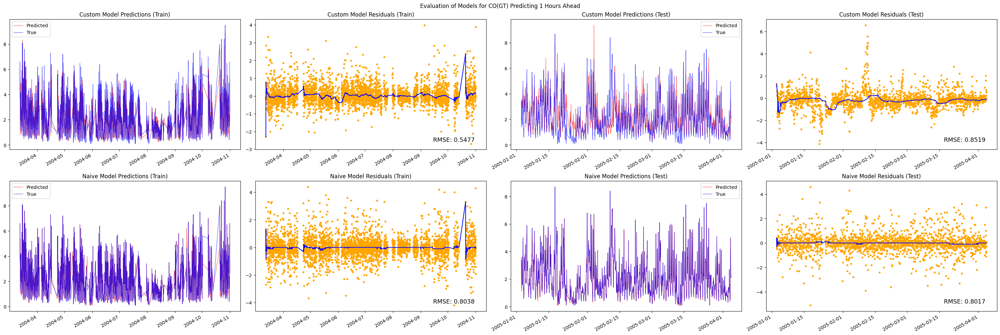

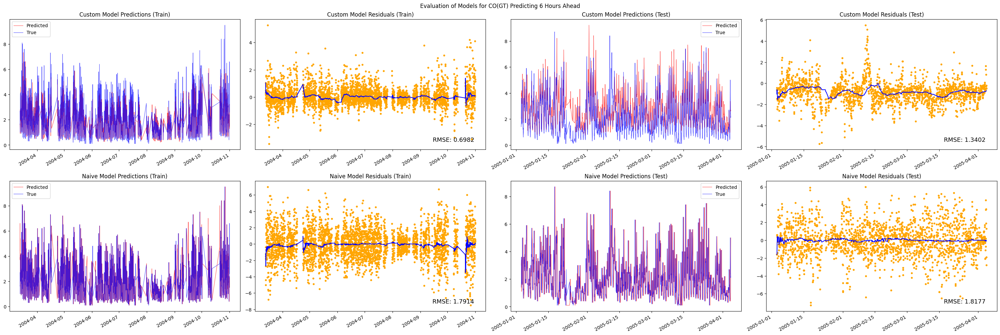

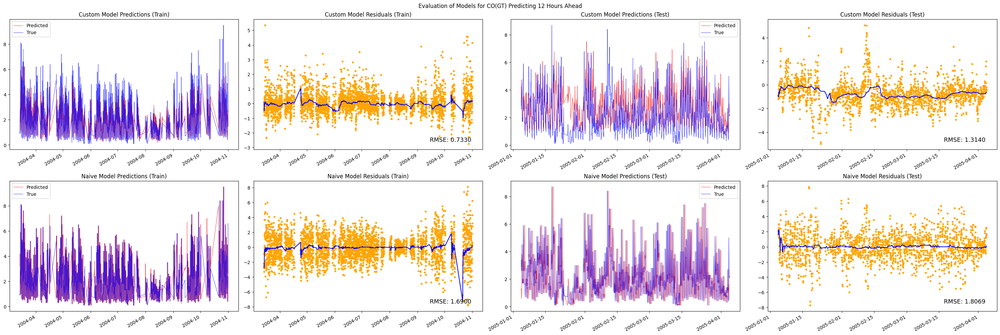

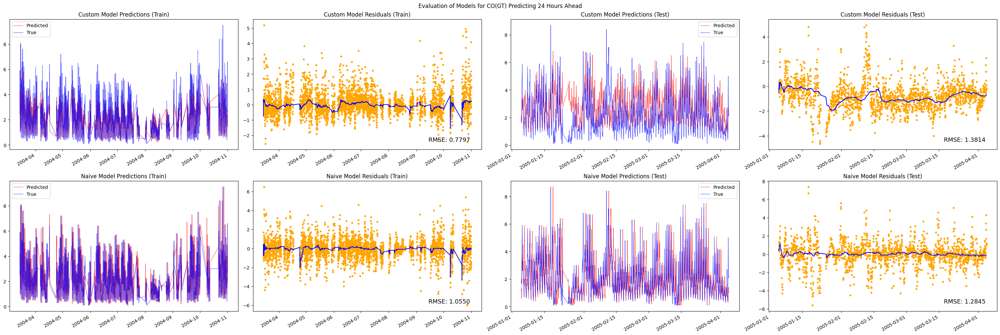

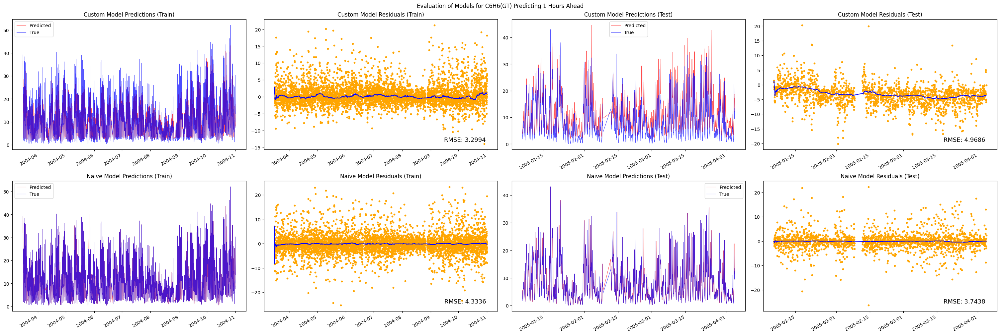

...

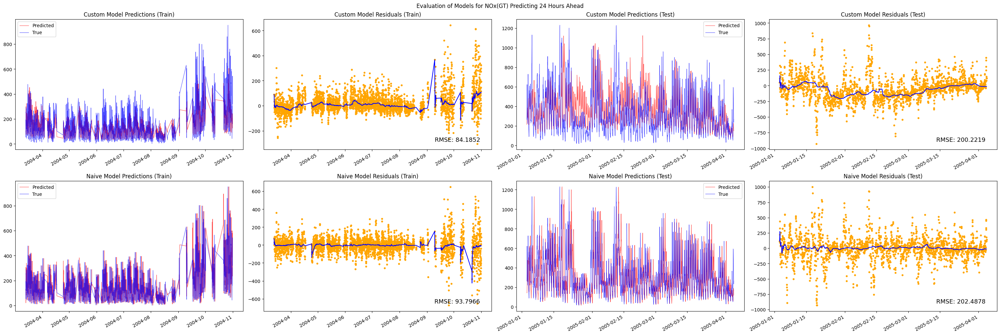

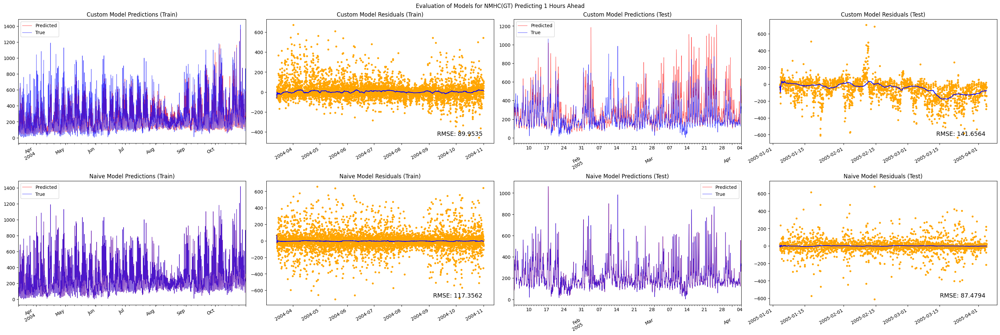

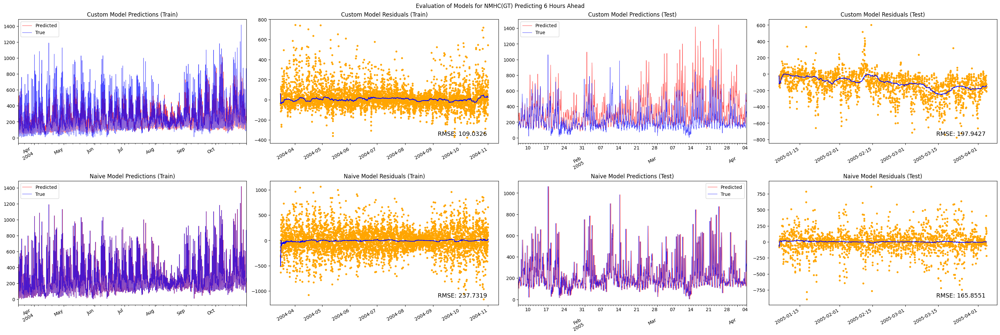

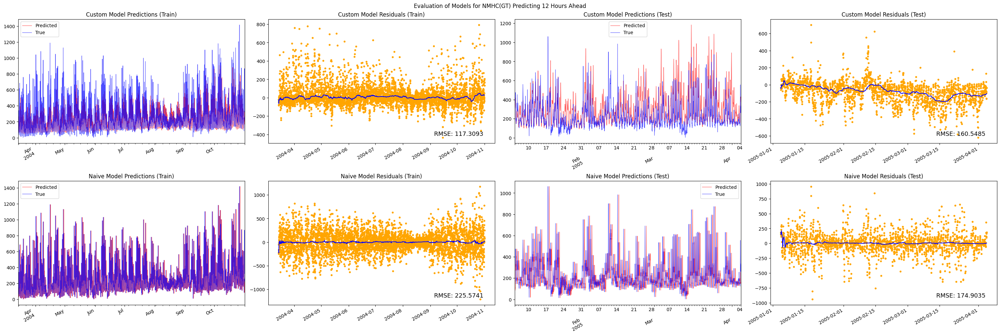

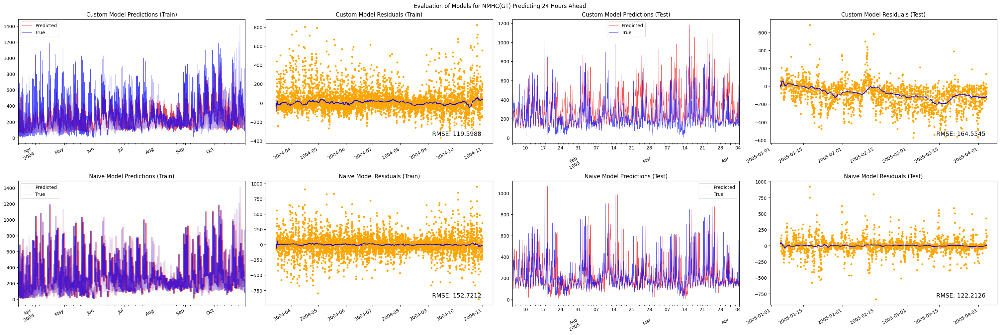

In [13]:
from statsmodels.graphics.tsaplots import plot_acf 

# Graphs of results
def graph_results(model_result : ModelResult, title):
    def evaluate_single(true, predictions, title_predictions, title_residuals, ax):
        # prediction plot
        line_pred = predictions.plot(linewidth=0.8, color='red', alpha=0.7, ax=ax[0], label='Predicted')
        line_true = true.plot(linewidth=0.8, color='blue', alpha=0.7, ax=ax[0], label='True')
        ax[0].set_title(title_predictions)
        ax[0].legend()

        for label in ax[0].get_xticklabels():
            label.set_rotation(30)
            label.set_ha('right') 
        ax[0].set_xlabel('')
        
        # residual plot
        residuals = true - predictions
        roll = residuals.rolling('168h').median()

        ax[1].scatter(residuals.index, residuals.values, s=10, color='orange')
        ax[1].set_title(title_residuals)
        ax[1].plot(roll.index, roll.values, color='blue')

        for label in ax[1].get_xticklabels():
            label.set_rotation(30)
            label.set_ha('right') 
        
        ax[1].text(0.95, 0.05, f'RMSE: {root_mean_squared_error(true.to_numpy(), predictions.to_numpy()):.4f}', transform=ax[1].transAxes, ha='right', va='bottom', fontsize='13')
            
    fig, ax = plt.subplots(2, 4, figsize=(30, 10), layout='constrained')

    predict_custom_train = model_result.train_predictions
    predict_naive_train = model_result.naive_train_predictions
    true_train = model_result.train_y_nona

    predict_custom_test = model_result.test_predictions
    predict_naive_test = model_result.naive_test_predictions
    true_test = model_result.test_y_nona

    evaluate_single(true_train, predict_custom_train, 'Custom Model Predictions (Train)', 'Custom Model Residuals (Train)', ax=ax[0, 0:2])
    evaluate_single(true_test, predict_custom_test, 'Custom Model Predictions (Test)', 'Custom Model Residuals (Test)', ax=ax[0, 2:4])
    evaluate_single(true_train, predict_naive_train, 'Naive Model Predictions (Train)', 'Naive Model Residuals (Train)', ax=ax[1, 0:2])
    evaluate_single(true_test, predict_naive_test, 'Naive Model Predictions (Test)', 'Naive Model Residuals (Test)', ax=ax[1, 2:4])
    
    fig.suptitle(title)


for  mtarget in targets:
    for mlag in lags:
        graph_results(results[(mtarget, mlag)], f'Evaluation of Models for {mtarget} Predicting {mlag} Hours Ahead')

In [20]:
import pickle 

# save results
with open('output_data/lin_model_pickle.pkl', 'wb') as f:
    pickle.dump(results, f)